In [ ]:
#!pip install pandas
#!pip install numpy
#!pip install matplotlib
#!pip install networkx

In [ ]:
print('Cambios realizados')

Cambios realizados


In [1]:
import networkx as nx
import warnings
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
warnings.filterwarnings('ignore')
%matplotlib inline

## Cargando el archivo del 2019

In [ ]:
df_2019 = pd.read_csv('data/traslados_2019_tp2_3_lima.csv')
df_2019

,COD_MOD,COD_MOD_DESTINO,WEIGHT
0,1038199,411504,1
1,503052,411504,1
2,826263,416057,2
3,1053818,411736,1
4,482042,411736,1
...,...,...,...
178899,328955,281972,1
178900,1531367,679472,1
178901,286427,1064120,1
178902,743716,636837,2


## Cargando el archivo del 2020

In [ ]:
df_2020 = pd.read_csv('data/traslados_2020_tp2_3_lima.csv')
df_2020

,COD_MOD,COD_MOD_DESTINO,WEIGHT
0,900993,416073,1
1,1010354,417758,1
2,649731,577346,1
3,1521236,577346,1
4,436162,412635,1
...,...,...,...
204313,332247,1342724,1
204314,320408,1342724,1
204315,826354,1342724,1
204316,1501709,1342724,1


## Cargando el archivo de labels

In [ ]:
df_labels = pd.read_csv('data/traslados_ie_labels_2.csv', encoding='Windows-1252', usecols=lambda col: col != 13)
df_labels

,COD_MOD,ANEXO,D_DPTO,D_PROV,D_DIST,D_REGION,D_DREUGEL,GESTION,D_NIV_MOD,NOMBRE_IE,NLONG_IE,NLAT_IE
0,415547,0,ANCASH,HUARAZ,INDEPENDENCIA,DRE ANCASH,UGEL HUARAZ,PUBLICO,Inicial - Jardín,123,-77.531910,-9.51885
1,415638,0,ANCASH,HUARAZ,HUARAZ,DRE ANCASH,UGEL HUARAZ,PUBLICO,Inicial - Jardín,122,-77.531960,-9.53067
2,415646,0,ANCASH,HUARAZ,HUARAZ,DRE ANCASH,UGEL HUARAZ,PUBLICO,Inicial - Jardín,233,-77.522700,-9.5311
3,415877,0,ANCASH,HUARAZ,INDEPENDENCIA,DRE ANCASH,UGEL HUARAZ,PRIVADO,Inicial - Jardín,COLEGIO PARROQUIAL NUESTRA SEÑORA DEL SAGRADO ...,-77.531481,-9.516673
4,567206,0,ANCASH,HUARAZ,INDEPENDENCIA,DRE ANCASH,UGEL HUARAZ,PUBLICO,Inicial - Jardín,268,-77.504026,-9.51394
...,...,...,...,...,...,...,...,...,...,...,...,...
173899,1794734,0,CAJAMARCA,CONTUMAZA,CONTUMAZA,DRE CAJAMARCA,UGEL CONTUMAZÁ,PUBLICO,Primaria,211,-78.652450,-7.34258
173900,1794742,0,HUANCAVELICA,HUAYTARA,SAN FRANCISCO DE SANGAYAICO,DRE HUANCAVELICA,UGEL HUAYTARÁ,PUBLICO,Secundaria,22586,-74.971787,-13.59848
173901,3007085,0,AMAZONAS,BAGUA,IMAZA,DRE AMAZONAS,UGEL IBIR-IMAZA,PUBLICO,Inicial - Jardín,451,-78.187444,-4.844992
173902,3007093,0,AMAZONAS,BAGUA,IMAZA,DRE AMAZONAS,UGEL IBIR-IMAZA,PUBLICO,Primaria,17901,-78.367603,-5.111024


## Crear el grafo dirigido con los archivos del 2019 y 2020

In [ ]:
G1 = nx.DiGraph()

for i in range(df_2019.shape[0]):
    f = df_2019.iloc[i,:].values
    f = f[~pd.isnull(f)]
    G1.add_edge(f[0], f[1], weight=f[2])

for i in range(df_2020.shape[0]):
    f = df_2020.iloc[i,:].values
    f = f[~pd.isnull(f)]
    G1.add_edge(f[0], f[1], weight=f[2])

In [ ]:
print('Cantidad de Colegios:',len(G1.nodes()))
print('Cantidad de Conexiones:',len(G1.edges()))

Cantidad de Colegios: 27583
Cantidad de Conexiones: 349505


## Analizando la naturaleza del grafo

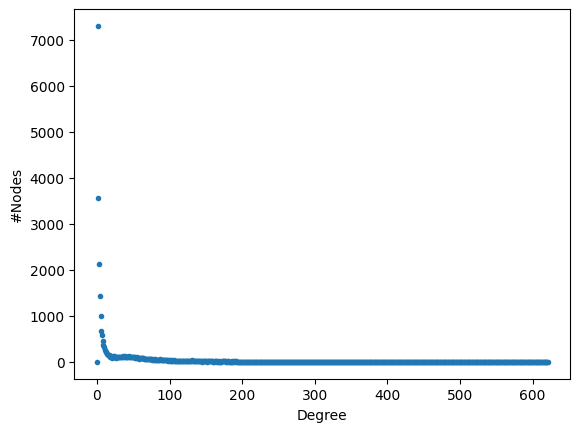

In [ ]:
hist = nx.degree_histogram(G1)

plt.plot(range(0, len(hist)), hist, '.')
plt.xlabel('Degree')
plt.ylabel('#Nodes')
#plt.loglog()
plt.show()

## Agregando etiquetas al grafo

In [ ]:
#dic_colegios = {}
#colegios_existentes = 0
#colegios_no_existentes = 0
for i in range(df_labels.shape[0]):
    f = df_labels.iloc[i,:].values
    f = f[~pd.isnull(f)]
    if G1.has_node(f[0]):
        #if(f[3] == 'LIMA'):
        G1.add_node(f[0], departamento=f[2], provincia=f[3], distrito=f[4], region=f[5], ugel=f[6], gestion=f[7], modalidad=f[8], label=f[9], nombre=f[9], lon=f[10], lat=f[11])
        #else:
        #G1.remove_node(f[0])
        #print('0:', f[0],'1:', f[1],'2:', f[2],'3:', f[3],'4:', f[4],'5:', f[5],'6:', f[6],'7:', f[7],'8:', f[8],'9:', f[9],'10:', f[10])
        #colegios_existentes += 1
    #else:
    #colegios_no_existentes += 1
    #print(f)
    #G1.add_edge(f[0], f[1], weight=f[2])

#print('cantidad de existentes:', colegios_existentes, ', no existentes:', colegios_no_existentes)

In [ ]:
# exportando grafo
nx.write_graphml(G1, 'out/colegios_2019_2020.graphml')

# Calculando las metricas de centralidad

## Degree Centrality

In [ ]:
degrees = dict(G1.degree()) # calcular los grados como diccionario

In [ ]:
ranks_degree_G1 = [(k,v) for k,v in sorted(degrees.items(), key=lambda item:-item[1])]
lista_ranks_degree = {G1.nodes()[n]['nombre']:v for n,v in ranks_degree_G1[:5]} #top 5 según grado
print(lista_ranks_degree)

{'TRILCE LOS OLIVOS': 621, '3057 SANTA ROSA DE CARABAYLLO': 597, 'TERESA GONZALES DE FANNING': 525, 'MERCEDES CABELLO DE CARBONERA': 493, 'TRILCE SALAVERRY': 491}


## Closeness Centrality

In [ ]:
closeness = nx.closeness_centrality(G1) # calcular la centralidad de cercania de todos los nodos

In [ ]:
ranks_closeness_G1 = [(k,v) for k,v in sorted(closeness.items(), key=lambda item:-item[1])]
lista_ranks_closeness = {G1.nodes()[n]['nombre']:v for n,v in ranks_closeness_G1[:5]} #top 5 según grado
print(lista_ranks_closeness)

{'CORONEL BRUNO TERREROS BALDEON': 0.095778334525857, 'DIONISIO MANCO CAMPOS': 0.0922943451668057, '3057 SANTA ROSA DE CARABAYLLO': 0.09146334453309829, 'TERESA GONZALES DE FANNING': 0.09028713902105495, '2038 INCA GARCILASO DE LA VEGA': 0.08659820482459583}


## Betweeness centrality

In [ ]:
betweeness = nx.betweenness_centrality(G1) # calcular la centralidad de intermediarios de todos los nodos

In [ ]:
ranks_betweeness_G1 = [(k,v) for k,v in sorted(betweeness.items(), key=lambda item:-item[1])]
lista_ranks_betweenness = {G1.nodes()[n]['nombre']:v for n,v in ranks_betweeness_G1[:5]} #top 5 según grado
print(lista_ranks_betweenness)

{'DIONISIO MANCO CAMPOS': 0.07577448151070064, 'JOSE ABELARDO QUIÑONES': 0.07557541286588924, '21015': 0.01940713475856744, 'SACRO COURE': 0.012568909554870005, 'AUGUSTO B. LEGUIA': 0.009327122938337649}


## Harmonic Centrality

In [ ]:
harmonic = nx.harmonic_centrality(G1) # calcular la centralidad harmonica de todos los nodos

In [ ]:
ranks_harmonic_G1 = [(k,v) for k,v in sorted(harmonic.items(), key=lambda item:-item[1])]
lista_ranks_harmonic = {G1.nodes()[n]['nombre']:v for n,v in ranks_harmonic_G1[:5]} #top 5 según grado
print(lista_ranks_harmonic)

{'MILITAR LEONCIO PRADO': 2831.1269841270887, 'DIONISIO MANCO CAMPOS': 2782.6476190475482, 'CORONEL BRUNO TERREROS BALDEON': 2763.835714285668, 'COLEGIO MAYOR SECUNDARIO PRESIDENTE DEL PERU': 2742.076984127094, '3057 SANTA ROSA DE CARABAYLLO': 2726.6500000000706}


## Pagerank Centrality

In [ ]:
pagerank = nx.pagerank(G1) # calcular el pagerank de todos los nodos

In [ ]:
ranks_pagerank_G1 = [(k,v) for k,v in sorted(pagerank.items(), key=lambda item:-item[1])]
lista_ranks_pagerank = {G1.nodes()[n]['nombre']:v for n,v in ranks_pagerank_G1[:5]} #top 5 según grado
print(lista_ranks_pagerank)

{'3057 SANTA ROSA DE CARABAYLLO': 0.0007477786120327778, 'LUIS FABIO XAMMAR JURADO': 0.0005296402834489942, 'PEAD LICEO NAVAL ALMIRANTE GUISE': 0.0005191053549974533, 'COLEGIO MAYOR SECUNDARIO PRESIDENTE DEL PERU': 0.0004892924948952113, 'MILITAR LEONCIO PRADO': 0.0004887809173439655}


# Preguntas Antonio:

### Simule su red con un gráfico aleatorio similar.

In [ ]:
!pip install powerlaw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import networkx as nx
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import powerlaw
warnings.filterwarnings('ignore')
%matplotlib inline 

* Cantidad de Colegios: 27583
* Cantidad de Conexiones: 349505

In [8]:
print('Cantida de colegios : ', 27583/4)
print('Cantida de colegios : ', 349505/4)

Cantida de colegios :  6895.75
Cantida de colegios :  87376.25


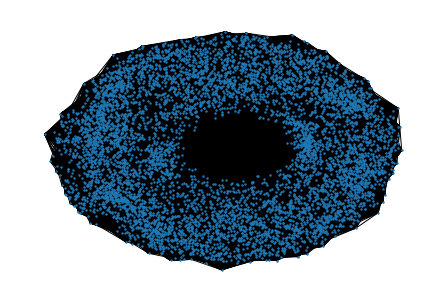

In [9]:
#crear un grafo ER con 400 nodos y 5% de probabilidad de conexión
er = nx.erdos_renyi_graph(6895, 0.05)
nx.draw(er, node_size=2)

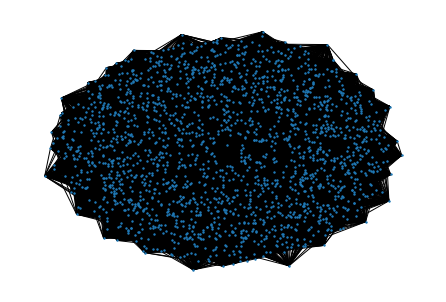

In [10]:
#crear un grafo ER con 400 nodos y 5% de probabilidad de conexión
er = nx.erdos_renyi_graph(2000, 0.05)
nx.draw(er, node_size=2)

In [12]:
print('Coeficiente de clustering:', nx.average_clustering(er))
print('Distancia promedio:', nx.average_shortest_path_length(er))

Coeficiente de clustering: 0.049909406823760535
Distancia promedio: 1.9566583291645823


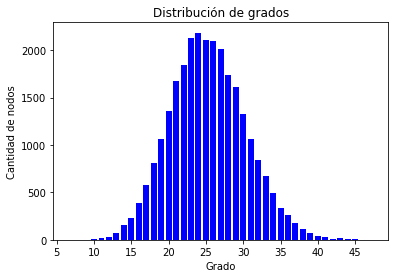

In [17]:
import networkx as nx
import matplotlib.pyplot as plt

# Generamos un grafo aleatorio con 27583 nodos y una probabilidad de conexión del 0.1
G = nx.erdos_renyi_graph(27583, 0.000918)

# Obtenemos la distribución de grados del grafo
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degreeCount = {}
for degree in degree_sequence:
    if degree in degreeCount:
        degreeCount[degree] += 1
    else:
        degreeCount[degree] = 1
deg, cnt = zip(*degreeCount.items())

# Graficamos la distribución de grados
plt.bar(deg, cnt, width=0.80, color='b')
plt.title("Distribución de grados")
plt.ylabel("Cantidad de nodos")
plt.xlabel("Grado")
plt.show()

In [19]:
print('Coeficiente de clustering:', nx.average_clustering(G))
print('Distancia promedio:', nx.average_shortest_path_length(G))

Coeficiente de clustering: 0.0009021548090437613
Distancia promedio: 3.5265250447339707


In [152]:
#imprimir todos los grados de los nodos
print(G.degree())
#convertir en diccionario
d = dict(G.degree())
print(d)

[(0, 32), (1, 28), (2, 29), (3, 32), (4, 23), (5, 16), (6, 25), (7, 21), (8, 23), (9, 34), (10, 23), (11, 32), (12, 25), (13, 23), (14, 25), (15, 23), (16, 26), (17, 19), (18, 21), (19, 24), (20, 34), (21, 19), (22, 18), (23, 30), (24, 26), (25, 31), (26, 32), (27, 26), (28, 22), (29, 23), (30, 27), (31, 36), (32, 22), (33, 20), (34, 25), (35, 27), (36, 20), (37, 25), (38, 23), (39, 24), (40, 25), (41, 30), (42, 28), (43, 19), (44, 25), (45, 20), (46, 32), (47, 29), (48, 24), (49, 24), (50, 28), (51, 27), (52, 20), (53, 19), (54, 30), (55, 34), (56, 23), (57, 19), (58, 31), (59, 23), (60, 29), (61, 26), (62, 29), (63, 24), (64, 21), (65, 28), (66, 20), (67, 19), (68, 31), (69, 25), (70, 28), (71, 26), (72, 24), (73, 27), (74, 31), (75, 18), (76, 29), (77, 21), (78, 17), (79, 23), (80, 20), (81, 24), (82, 31), (83, 24), (84, 28), (85, 24), (86, 27), (87, 29), (88, 25), (89, 18), (90, 18), (91, 30), (92, 30), (93, 27), (94, 27), (95, 28), (96, 32), (97, 27), (98, 28), (99, 27), (100, 22)

In [162]:
aux = pd.DataFrame.from_dict(d.items())
aux.columns = ['nodo', 'grado']
aux.grado.mean()


25.279701265272088

In [149]:
G

In [156]:
# Calcular el grado el nodo aleatorio:
def grado_matriz(G):
    n = len(G)
    grado_total = 0
    for i in range(n):
        grado = 0
        for j in range(n):
            if G[i][j] == 1:
                grado += 1
        grado_total += grado
        print(f"Grado del vértice {i}: {grado}")
    print(f"Grado total del grafo: {grado_total}")

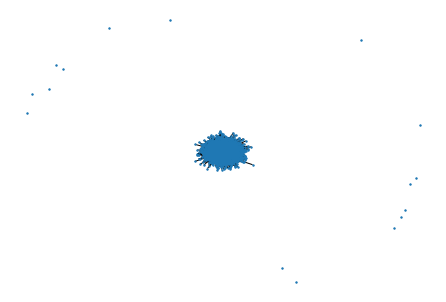

In [20]:
H = nx.erdos_renyi_graph(6800, 0.000918)
nx.draw(H, node_size=2)

In [21]:
clustering_coefficients = nx.clustering(G)

In [31]:
aux  = pd.DataFrame(clustering_coefficients.items())
aux.columns = ['nodo', 'coef']
aux.sort_values(by = ['coef'], ascending  = False).style.background_gradient(subset=['coef'])

In [24]:
# Imprime los coeficientes de agrupamiento para cada nodo
nodo = []
coef = []
print("Coeficientes de agrupamiento para cada nodo:")
for node, cc in clustering_coefficients.items():
    print(f"Nodo {node}: {cc}")

Se han truncado las últimas 5000 líneas del flujo de salida.
Nodo 22583: 0
Nodo 22584: 0.002849002849002849
Nodo 22585: 0
Nodo 22586: 0
Nodo 22587: 0
Nodo 22588: 0.005847953216374269
Nodo 22589: 0
Nodo 22590: 0
Nodo 22591: 0.003952569169960474
Nodo 22592: 0
Nodo 22593: 0.0026455026455026454
Nodo 22594: 0.0017825311942959
Nodo 22595: 0
Nodo 22596: 0
Nodo 22597: 0
Nodo 22598: 0
Nodo 22599: 0.005847953216374269
Nodo 22600: 0
Nodo 22601: 0
Nodo 22602: 0
Nodo 22603: 0
Nodo 22604: 0
Nodo 22605: 0
Nodo 22606: 0.003952569169960474
Nodo 22607: 0
Nodo 22608: 0
Nodo 22609: 0.005291005291005291
Nodo 22610: 0.0022988505747126436
Nodo 22611: 0.003952569169960474
Nodo 22612: 0
Nodo 22613: 0
Nodo 22614: 0
Nodo 22615: 0
Nodo 22616: 0
Nodo 22617: 0
Nodo 22618: 0
Nodo 22619: 0.005689900426742532
Nodo 22620: 0
Nodo 22621: 0
Nodo 22622: 0.0033333333333333335
Nodo 22623: 0
Nodo 22624: 0
Nodo 22625: 0
Nodo 22626: 0
Nodo 22627: 0
Nodo 22628: 0
Nodo 22629: 0
Nodo 22630: 0
Nodo 22631: 0
Nodo 22632: 0
Nodo 22633

In [25]:
# Calcula el coeficiente de agrupamiento promedio para el grafo
avg_clustering_coefficient = nx.average_clustering(G)
avg_clustering_coefficient

0.0009021548090437613

In [40]:

aux

{'TRILCE LOS OLIVOS': 471,
 '3057 SANTA ROSA DE CARABAYLLO': 597,
 'TERESA GONZALES DE FANNING': 419,
 'MERCEDES CABELLO DE CARBONERA': 493,
 'TRILCE SALAVERRY': 491,
 'TRILCE LOS OLIVOS DE PROLIMA': 425,
 'MILITAR LEONCIO PRADO': 418,
 'APPU-SAN CARLOS': 415,
 'ARGENTINA': 396,
 'AUGUSTO B. LEGUIA': 387,
 '6050 JUANA ALARCO DE DAMMERT': 380,
 'GRAN MARISCAL ANDRES AVELINO CACERES DORREGARAY': 374}

,colegio,DegreeCentrality
0,TRILCE LOS OLIVOS,471
1,3057 SANTA ROSA DE CARABAYLLO,597
2,TERESA GONZALES DE FANNING,419
3,MERCEDES CABELLO DE CARBONERA,493
4,TRILCE SALAVERRY,491
5,TRILCE LOS OLIVOS DE PROLIMA,425
6,MILITAR LEONCIO PRADO,418
7,APPU-SAN CARLOS,415
8,ARGENTINA,396
9,AUGUSTO B. LEGUIA,387


In [125]:
aux1 = {'TRILCE LOS OLIVOS': 471, '3057 SANTA ROSA DE CARABAYLLO': 597, 'TERESA GONZALES DE FANNING': 419, 'MERCEDES CABELLO DE CARBONERA': 493, 'TRILCE SALAVERRY': 491, 'TRILCE LOS OLIVOS DE PROLIMA': 425, 'MILITAR LEONCIO PRADO': 418, 'APPU-SAN CARLOS': 415, 'ARGENTINA': 396, 'AUGUSTO B. LEGUIA': 387, '6050 JUANA ALARCO DE DAMMERT': 380, 'GRAN MARISCAL ANDRES AVELINO CACERES DORREGARAY': 374}
aux1 = pd.DataFrame.from_dict(aux1.items())
aux1.columns = ['colegio', 'DegreeCentrality']

aux2 = {'CORONEL BRUNO TERREROS BALDEON': 0.095778334525857, 'DIONISIO MANCO CAMPOS': 0.0922943451668057, '3057 SANTA ROSA DE CARABAYLLO': 0.09146334453309829, 'TERESA GONZALES DE FANNING': 0.09028713902105495, '2038 INCA GARCILASO DE LA VEGA': 0.08659820482459583, '2024': 0.08612739838587566, '3059 REPUBLICA DE ISRAEL': 0.08606141416925463, 'GLORIOSOS HUSARES DE JUNIN': 0.08589390967900444, '2089 MICAELA BASTIDAS': 0.08579848525497555, '2057 JOSE GABRIEL CONDORCANQUI': 0.08528330351591952, 'GRAN MARISCAL ANDRES AVELINO CACERES DORREGARAY': 0.08505436292966395, '2058 VIRGEN DE LA MEDALLA MILAGROSA': 0.08501925035380196, '2047': 0.08500755260334053, '1120 PEDRO ADOLFO LABARTHE EFFIO': 0.0849199219738958, '6050 JUANA ALARCO DE DAMMERT': 0.08483247182769174}
aux2 = pd.DataFrame.from_dict(aux2.items())
aux2.columns = ['colegio', 'DegreeCentrality']

aux3 ={'DIONISIO MANCO CAMPOS': 0.07577448151070064, 'JOSE ABELARDO QUIÑONES': 0.07557541286588924, '21015': 0.01940713475856744, 'SACRO COURE': 0.012568909554870005, 'AUGUSTO B. LEGUIA': 0.009327122938337649, 'TESLA SCHOOLS': 0.007830589304976727, 'GEUNI': 0.0071321336718910685, '7089 ROMEO LUNA VICTORIA': 0.00640446012112429, '1221 MARIA PARADO DE BELLIDO': 0.006181545880988897, 'SAN MARCOS DE COMAS': 0.006158431220287161, '6085 BRIGIDA SILVA DE OCHOA': 0.005842359663656553, '20179 ALEJANDRO CAMACHO CUYA': 0.0053321230296133355, '20927': 0.004994844914764771, 'MARIA REYNA DEL CIELO': 0.004867570250905325, 'APOSTOL SAN PEDRO': 0.004084390125287142}
aux3 = pd.DataFrame.from_dict(aux3.items())
aux3.columns = ['colegio', 'DegreeCentrality']

aux4 ={'MILITAR LEONCIO PRADO': 2831.1269841270887, 'DIONISIO MANCO CAMPOS': 2782.6476190475482, 'CORONEL BRUNO TERREROS BALDEON': 2763.835714285668, 'COLEGIO MAYOR SECUNDARIO PRESIDENTE DEL PERU': 2742.076984127094, '3057 SANTA ROSA DE CARABAYLLO': 2726.6500000000706, 'AUGUSTO B. LEGUIA': 2721.689285714215, '7089 ROMEO LUNA VICTORIA': 2714.555952380888, '6085 BRIGIDA SILVA DE OCHOA': 2705.7226190475512, 'TERESA GONZALES DE FANNING': 2672.3166666667507, 'MERCEDES CABELLO DE CARBONERA': 2650.9103174604243, 'TRILCE SALAVERRY': 2623.476984127094, 'MARIA REYNA DEL CIELO': 2622.405952380891, 'TRILCE LOS OLIVOS': 2618.7769841270833, 'ARGENTINA': 2614.060317460425}
aux4 = pd.DataFrame.from_dict(aux4.items())
aux4.columns = ['colegio', 'DegreeCentrality']

aux5 ={'3057 SANTA ROSA DE CARABAYLLO': 0.0007477786120327778, 'LUIS FABIO XAMMAR JURADO': 0.00047938409890179205, 'PEAD LICEO NAVAL ALMIRANTE GUISE': 0.0005191053549974533, 'COLEGIO MAYOR SECUNDARIO PRESIDENTE DEL PERU': 0.0004892924948952113, 'MILITAR LEONCIO PRADO': 0.0004887809173439655, '2038 INCA GARCILASO DE LA VEGA': 0.000418164252159568, '1236 ALFONSO BARRANTES LINGAN': 0.0004070671386362392, 'LIBERTAD': 0.0003991533797197188, 'TRILCE LOS OLIVOS': 0.00038124142864930896, 'NUESTRA SEÑORA DEL CARMEN': 0.0003758901730661386, 'TERESA GONZALES DE FANNING': 0.00036821594780432756, 'JOSE MARIA ARGUEDAS': 0.00036731465371622063, '2089 MICAELA BASTIDAS': 0.0003588990100755526, '3061 JORGE CHAVEZ DARTNELL': 0.0003583994177471554}
aux5 = pd.DataFrame.from_dict(aux5.items())
aux5.columns = ['colegio', 'DegreeCentrality']

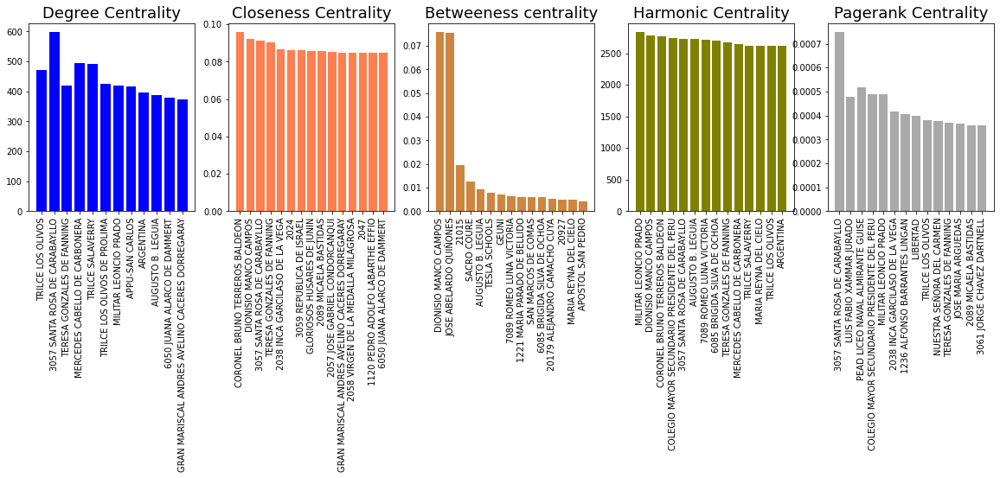

In [148]:
plt.subplot(1,5,1)
plt.rcParams['figure.figsize']=20,4
plt.bar(aux.colegio, aux.DegreeCentrality, color='blue')
plt.xticks(rotation=90)
plt.title('Degree Centrality',fontsize=18)

plt.subplot(1,5 ,2)
plt.rcParams['figure.figsize']=20,4
plt.bar(aux2.colegio, aux2.DegreeCentrality, color='coral')
plt.xticks(rotation=90)
plt.title('Closeness Centrality',fontsize=18)

plt.subplot(1,5,3)
plt.rcParams['figure.figsize']=20,4
plt.bar(aux3.colegio, aux3.DegreeCentrality, color='peru')
plt.xticks(rotation=90)
plt.title('Betweeness centrality',fontsize=18)

plt.subplot(1,5,4)
plt.rcParams['figure.figsize']=20,4
plt.bar(aux4.colegio, aux4.DegreeCentrality, color='olive')
plt.xticks(rotation=90)
plt.title('Harmonic Centrality',fontsize=18)

plt.subplot(1,5,5)
plt.rcParams['figure.figsize']=20,4
plt.bar(aux5.colegio, aux5.DegreeCentrality, color='darkgrey')
plt.xticks(rotation=90)
plt.title('Pagerank Centrality',fontsize=18)
plt.show()